<div style="display: flex; align-items: center; justify-content: center; flex-wrap: wrap;">
    <div style="flex: 1; max-width: 400px; display: flex; justify-content: center;">
        <img src="https://i.ibb.co/JBPWVYR/Logo-Nova-IMS-Black.png" style="max-width: 50%; height: auto; margin-top: 50px; margin-bottom: 50px;margin-left: 6rem;">
    </div>
    <div style="flex: 2; text-align: center; margin-top: 20px;margin-left: 8rem;">
        <div style="font-size: 28px; font-weight: bold; line-height: 1.2;">
            <span style="color: #22c1c3;">DL Project |</span> <span style="color: #08529C;">Predicting Rare Species from Images using Deep Learning</span>
        </div>
        <div style="font-size: 17px; font-weight: bold; margin-top: 10px;">
            Spring Semester | 2024 - 2025
        </div>
        <div style="font-size: 17px; font-weight: bold;">
            Master in Data Science and Advanced Analytics
        </div>
        <div style="margin-top: 20px;">
            <div>André Silvestre, 20240502</div>
            <div>Diogo Duarte, 20240525</div>
            <div>Filipa Pereira, 20240509</div>
            <div>Maria Cruz, 20230760</div>
            <div>Umeima Mahomed, 20240543</div>
        </div>
        <div style="margin-top: 20px; font-weight: bold;">
            Group 37
        </div>
    </div>
</div>

<div style="background: linear-gradient(to right, #22c1c3, #27b1dd, #2d9cfd, #090979); 
            padding: 1px; color: white; border-radius: 500px; text-align: center;">
</div>

# **Project Structure**


<ol style="list-style-type: upper-roman;font-weight: bold;">
  <li><span style = "font-weight: normal;"><a href="#1">Data Understanding</a></span></li>
  <li>
    <span style="font-weight: normal;">
      <a href="#2">Data Preparation</a>
    </span>
    <ol style="list-style-type:decimal;">
      <li><span style="font-weight: normal;"><a href="#DP_NaNs">Missing Values</a></span></li>
      <li><span style="font-weight: normal;"><a href="#DP_Duplicates">Duplicates</a></span></li>
      <li><span style="font-weight: normal;"><a href="#DP_Outliers">Outliers</a></span></li>
    </ol>
  <li><span style="font-weight: normal;"><a href="./2_FeatureEngineering_MLProject_Group33.ipynb#DP_FeatureEng">Feature Engineering</a></span></li>
  <li><span style = "font-weight: normal;"><a href="./3_Modeling&Evaluation_MLProject_Group33.ipynb#3">Modeling & Evaluation</a></ol></li>
</ol>

# <a class='anchor' id='1'></a>

<style>
@import url('https://fonts.cdnfonts.com/css/avenir-next-lt-pro?styles=29974');
</style>

<div style="background: linear-gradient(to right, #22c1c3, #27b1dd, #2d9cfd, #090979); 
            padding: 15px; color: white; border-radius: 300px; text-align: center;">
    <center><h1 style="margin-left: 100px;margin-top: 10px; margin-bottom: 4px; color: white;
                       font-size: 32px; font-family: 'Avenir Next LT Pro', sans-serif;"><b>1 | Business & Data Understanding</b></h1></center>
</div>

<br><br>

## **🎲 Dataset[<sup>[1]</sup>]((https://imageomics.github.io/bioclip/))**

- In this project, you will develop a deep-learning model to classify rare species based on their images. The dataset used in this project consists of images of **rare species** sourced from the Encyclopedia of Life (EOL) and curated as part of the **BioCLIP: A Vision Foundation Model for the Tree of Life [<sup>[1]</sup>]((https://imageomics.github.io/bioclip/))** study. Each image is associated with metadata, including its **`kingdom`**, **`phylum`**, and **`family`**. 

<br>

<center><img src="https://huggingface.co/datasets/imageomics/rare-species/resolve/main/visuals/phyla_ToL_tree.png" height="500"></center><br>
<center><b>Figure 1 | </b> Phylogenetic tree of the phyla in the dataset.</center> 
<center><b>Source: </b> <a href="https://huggingface.co/datasets/imageomics/rare-species">Hugging Face Datasets (2024)</a></center>

<br><br>

## **👨‍💻 Project Goals**

- The objective is to build a **model that predicts the `family` of a given species based on its image**. 

- The dataset includes a structured `CSV` file containing the file path of each image alongside its corresponding labels. 

- As part of the project, you will need to create your own data splits into training, validation, and test sets. The training and validation sets will be used to develop and fine-tune your model, while the test set should be kept separate to evaluate its performance on unseen data. 


<br><br>

### **Dataset Attributes: [<sup>[2]</sup>](https://huggingface.co/datasets/imageomics/TreeOfLife-10M)**

<center><b>Table 1 | </b> Dataset Attributes with Descriptions  <br><br>

|        |  **ATTRIBUTE**   |                   **DESCRIPTION**                                  | **DATA TYPE** |
|:------:|:----------------:|--------------------------------------------------------------------|:-------------:|
| **1** | `rare_species_id` | Unique identifier for the image in the dataset.                    | String        |
| **2** | `eol_content_id`  | Unique identifier within EOL database for images sourced from EOL. | Int           |
| **3** | `eol_page_id`     | Identifier of page from which images from EOL are sourced.         | Int           |
| **4** | `kingdom`         | Kingdom to which the subject of the image belongs (all Animalia).  | String        |
| **5** | `phylum`          | Phylum to which the subject of the image belongs.                  | String        |
| **6** | `family`          | Family to which the subject of the image belongs.                  | String        |
| **7** | `file_path`       | Path to the image file.                                            | String        |

</center>

<br><br>

<div style="background: linear-gradient(to right, #22c1c3, #27b1dd, #2d9cfd, #090979); 
            padding: 1px; color: white; border-radius: 500px; text-align: center;">
</div>

## 📚 **Libraries Import**

In [2]:
# Print python version
import sys
print(sys.version)

3.10.12 (main, Feb  4 2025, 14:57:36) [GCC 11.4.0]


In [3]:
# System imports
import os
import sys
from tqdm import tqdm
from typing_extensions import Self, Any      # For Python 3.10
# from typing import Self, Any               # For Python >3.11

from pathlib import Path

# Data manipulation imports
import numpy as np
import pandas as pd  
import warnings
warnings.filterwarnings("ignore")

# Data visualization imports
import matplotlib.pyplot as plt
import seaborn as sns

# Machine learning imports
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Deep learning imports
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers import Adam

# Evaluation imports
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, precision_score, recall_score

# Other imports
from itertools import product

# Image processing imports
from matplotlib.image import imread
from PIL import Image

# Set the style of the visualization
pd.set_option('future.no_silent_downcasting', True)   # use int instead of float in DataFrame
pd.set_option("display.max_columns", None)            # display all columns

# Disable warnings (FutureWarning)
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)

# For better resolution plots
%config InlineBackend.figure_format = 'retina'
# Setting seaborn style
sns.set_theme(style="white")

# Set random seed for reproducibility
np.random.seed(2025)

2025-03-29 18:50:38.728757: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1743274238.864639    1090 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1743274238.903717    1090 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1743274239.249393    1090 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1743274239.249433    1090 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1743274239.249435    1090 computation_placer.cc:177] computation placer alr

In [4]:
print("TensorFlow Version:", tf.__version__)
print("Is TensorFlow built with CUDA?", tf.test.is_built_with_cuda())
print("GPU Available:", tf.config.list_physical_devices('GPU'))
print("GPU Device Name:", tf.test.gpu_device_name())

if tf.test.is_built_with_cuda():
    tf.config.experimental.set_memory_growth(tf.config.list_physical_devices('GPU')[0], True)

TensorFlow Version: 2.19.0
Is TensorFlow built with CUDA? True
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPU Device Name: /device:GPU:0


I0000 00:00:1743274243.973149    1090 gpu_device.cc:2019] Created device /device:GPU:0 with 3586 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6


---

## 🧮 **Import Databases**

In [5]:
# Load the data
rare_species_df = pd.read_csv("./data/rare_species 1/metadata.csv")

# Display the first 5 rows of the dataset
rare_species_df.head(5)

,rare_species_id,eol_content_id,eol_page_id,kingdom,phylum,family,file_path
0,75fd91cb-2881-41cd-88e6-de451e8b60e2,12853737,449393,animalia,mollusca,unionidae,mollusca_unionidae/12853737_449393_eol-full-si...
1,28c508bc-63ff-4e60-9c8f-1934367e1528,20969394,793083,animalia,chordata,geoemydidae,chordata_geoemydidae/20969394_793083_eol-full-...
2,00372441-588c-4af8-9665-29bee20822c0,28895411,319982,animalia,chordata,cryptobranchidae,chordata_cryptobranchidae/28895411_319982_eol-...
3,29cc6040-6af2-49ee-86ec-ab7d89793828,29658536,45510188,animalia,chordata,turdidae,chordata_turdidae/29658536_45510188_eol-full-s...
4,94004bff-3a33-4758-8125-bf72e6e57eab,21252576,7250886,animalia,chordata,indriidae,chordata_indriidae/21252576_7250886_eol-full-s...


In [6]:
# Number of rows and columns
print("\033[1mDataset \033[0m")
print("  Number of rows:", rare_species_df.shape[0])
print("  Number of columns:", rare_species_df.shape[1])

# Name of the columns
print("\n\033[1mColumns \033[0m")
print("  ", rare_species_df.columns.to_list())

Dataset 
  Number of rows: 11983
  Number of columns: 7

Columns 
   ['rare_species_id', 'eol_content_id', 'eol_page_id', 'kingdom', 'phylum', 'family', 'file_path']


In [7]:
# Colors list for plotting
colors = ['#22c1c3', '#27b1dd', '#2d9cfd', '#090979']

## 📋 **Evaluate Data**

We start by loading the dataset and evaluating its structure and contents.
- Duplicates
- Data Types
- Missing Values 
- Distinct Values
- Distribution of Classes
- Data Visualization

### 🔄 **Duplicates**

In [8]:
# Checking for duplicates
print(f"\nNumber of duplicate rows: {rare_species_df.duplicated().sum()}")


Number of duplicate rows: 0


### 🔢🔠 **Data Types**

In [9]:
# Check data types
pd.DataFrame(rare_species_df.dtypes, columns=['Data Type'])

,Data Type
rare_species_id,object
eol_content_id,int64
eol_page_id,int64
kingdom,object
phylum,object
family,object
file_path,object


### 🔎 **Missing Values and Distinct Values**

In [10]:
# Check for missing values (n = number of missing values & % = percentage of missing values)
pd.DataFrame({
    "n NAs": rare_species_df.isnull().sum(),
    "% NAs": round(rare_species_df.isnull().mean() * 100, 1)
})

,n NAs,% NAs
rare_species_id,0,0.0
eol_content_id,0,0.0
eol_page_id,0,0.0
kingdom,0,0.0
phylum,0,0.0
family,0,0.0
file_path,0,0.0


In [11]:
# Check for unique values in each column
pd.DataFrame(rare_species_df.nunique(), columns=['Number of Unique Values'])

,Number of Unique Values
rare_species_id,11983
eol_content_id,11983
eol_page_id,400
kingdom,1
phylum,5
family,202
file_path,11983


---

# <a class='anchor' id='2'></a>
<br>
<style>
@import url('https://fonts.cdnfonts.com/css/avenir-next-lt-pro?styles=29974');
</style>

<div style="background: linear-gradient(to right, #22c1c3, #27b1dd, #2d9cfd, #090979); 
            padding: 10px; color: white; border-radius: 300px; text-align: center;">
    <center><h1 style="margin-top: 10px; margin-bottom: 4px; color: white;
                       font-size: 32px; font-family: 'Avenir Next LT Pro', sans-serif;">
        <b>2 | Data Preparation</b></h1></center>
</div>

<br><br>

## 🔎 **EDA - Exploratory Data Analysis**

### **`phylum`** variable

In [12]:
# Absolute and Relative Frequency of the 'phylum' column
pd.DataFrame({
    "n": rare_species_df['phylum'].value_counts(),
    "%": round(rare_species_df['phylum'].value_counts(normalize=True) * 100, 2)
}).sort_values(by='n', ascending=False)

,n,%
phylum,,
chordata,9952,83.05
arthropoda,951,7.94
cnidaria,810,6.76
mollusca,210,1.75
echinodermata,60,0.50


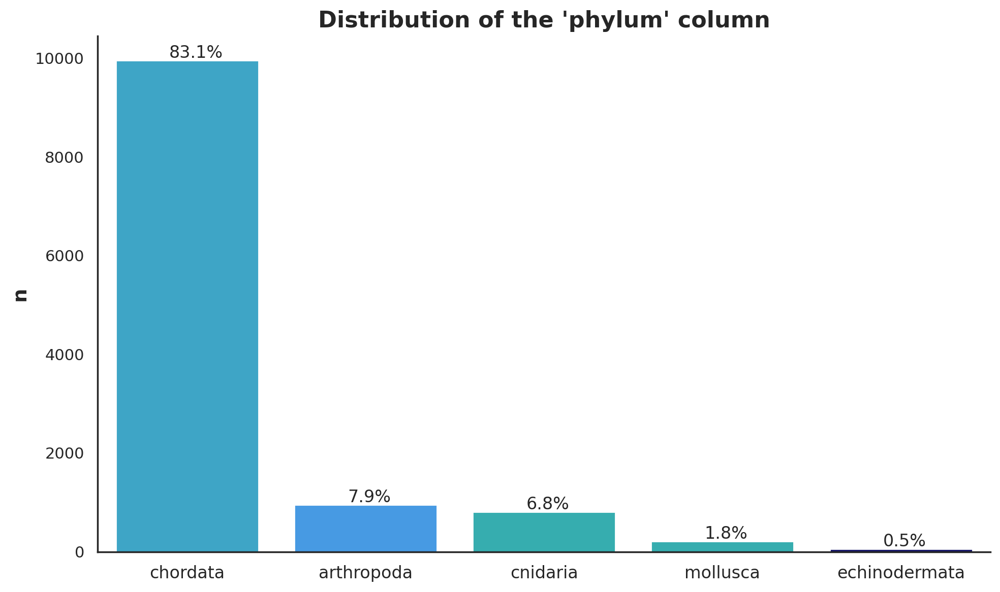

In [13]:
# Color palette associated with the 'phylum' column
phylum_palette = {
    'chordata': '#22c3be',
    'arthropoda': '#27c8dd',
    'cnidaria': '#2dc6fd',
    'mollusca': '#2d9cfd',
    'echinodermata': '#090979',
}

# Plot the distribution of the 'phylum' column
plt.figure(figsize=(10, 6))
sns.countplot(data=rare_species_df, 
              x='phylum', 
              order=rare_species_df['phylum'].value_counts().index,
              hue='phylum',
              palette=colors,
              stat='count')

# Annotate the plot with the percentage of each class
for p in plt.gca().patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / rare_species_df.shape[0])
    x = p.get_x() + p.get_width() / 2 - 0.1
    y = p.get_height() + 50
    plt.gca().annotate(percentage, (x, y), size = 12)


plt.title("Distribution of the 'phylum' column", fontsize=16, weight='bold')
plt.xlabel("")
plt.ylabel("n", fontsize=14, weight='bold')
plt.xticks(rotation=0, fontsize=12)
sns.despine(right=True, top=True)
plt.tight_layout()
plt.show()

- The `phylum` variable is a categorical variable that represents the taxonomic rank of the species.
- Analysis of the `phylum` variable reveals that:
  - the **majority** of the images belong to the **`Chordata`** ($83\%$) phylum, which includes vertebrates such as mammals, birds, reptiles, amphibians, and fish.
  - The **second** most common phylum is **`Arthropoda`** ($\approx 8\%$), which includes invertebrates such as insects, arachnids, and crustaceans.
  - The **third** most common phylum is **`Cnidaria`** ($\approx 7\%$), which includes invertebrates such as jellyfish, corals, and sea anemones.
  - The **fourth** most common phylum is **`Mollusca`** $\approx 2\%$, which includes invertebrates such as snails, clams, and octopuses.
  - The **fifth** most common phylum is **`Echinodermata`** ($0.5\%$), which includes invertebrates such as sea stars, sea urchins, and sea cucumbers.

**Source:** http://www.fossilmuseum.net/Tree_of_Life/Kingdom_animalia/animalphyla.htm

### **`family` variable (Target Variable)**

In [14]:
# Absolute and Relative Frequency of the 'family' column
pd.DataFrame({
    "n": rare_species_df['family'].value_counts(),
    "%": round(rare_species_df['family'].value_counts(normalize=True) * 100, 2)
}).sort_values(by='n', ascending=False)

,n,%
family,,
dactyloidae,300,2.50
cercopithecidae,300,2.50
formicidae,291,2.43
carcharhinidae,270,2.25
salamandridae,270,2.25
...,...,...
cyprinodontidae,30,0.25
alligatoridae,30,0.25
balaenidae,30,0.25


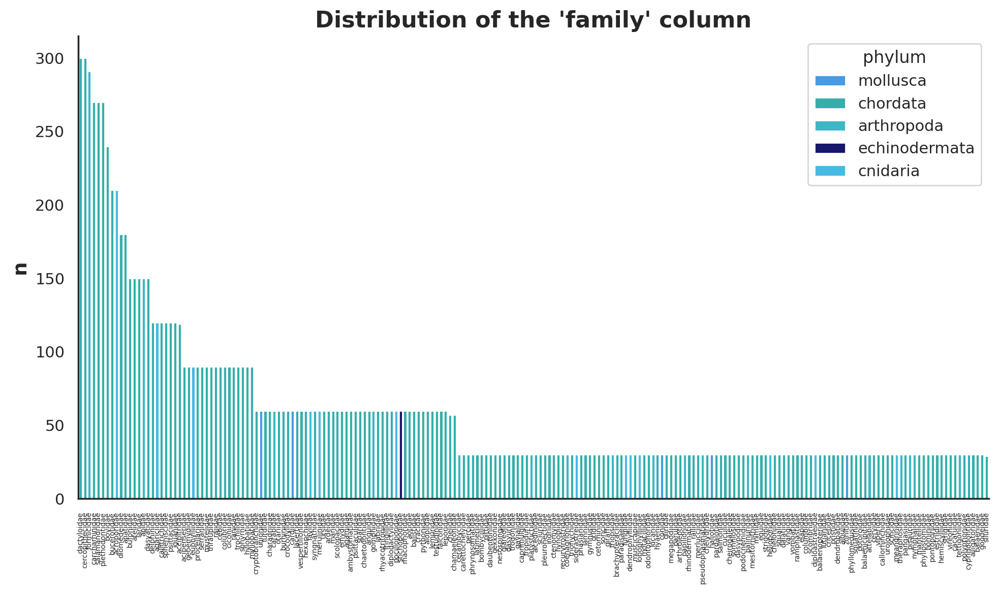

In [15]:
# Distribution of target variable ('family')
plt.figure(figsize=(10, 6))
sns.countplot(data=rare_species_df, 
              x='family', 
              order=rare_species_df['family'].value_counts().index,
              hue='phylum',
              palette=phylum_palette,
              stat='count')
    
plt.title("Distribution of the 'family' column", fontsize=16, weight='bold')
plt.xlabel("")
plt.ylabel("n", fontsize=14, weight='bold')
plt.xticks(rotation=90, fontsize=5)
sns.despine(right=True, top=True)
plt.tight_layout()
plt.show()

- **`family`** is the target variable for this project. It is a categorical variable with 202 distinct classes.
- The distribution of the target variable is highly imbalanced, with some classes having significantly more samples than others. This imbalance can affect the performance of machine learning models, as they may be biased towards the majority classes.
- To address this issue, we will consider using techniques such as **oversampling**, **undersampling**, or **class weighting** during model training to ensure that the model learns effectively from all classes.

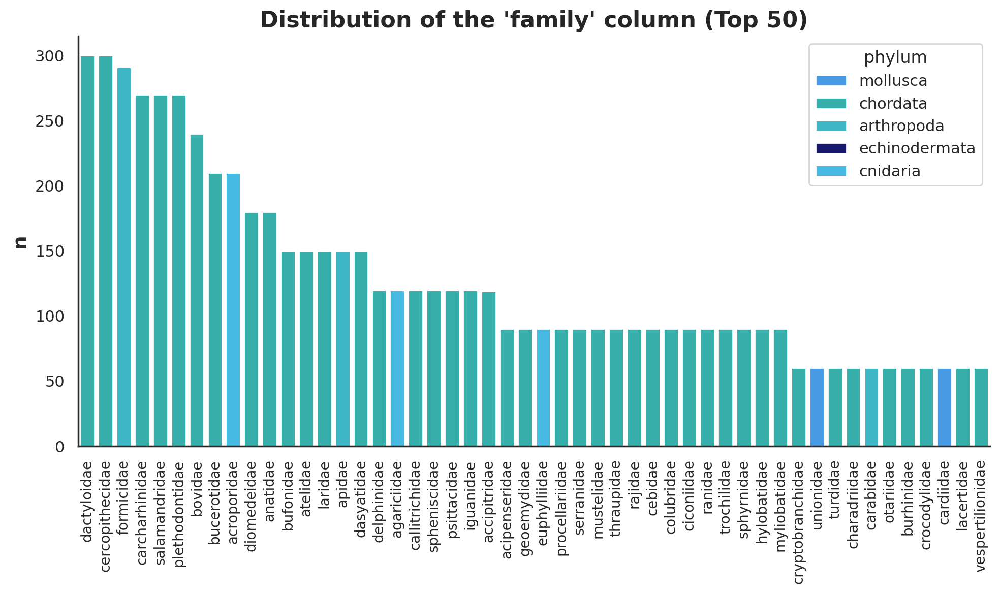

In [16]:
# Plot only the top 50 common families
plt.figure(figsize=(10, 6))
sns.countplot(data=rare_species_df.sort_values(by='family', ascending=False),
              x='family', 
              order=rare_species_df['family'].value_counts().index[:50],
              hue='phylum',
              palette=phylum_palette,
              stat='count')
plt.title("Distribution of the 'family' column (Top 50)", fontsize=16, weight='bold')
plt.xlabel("")
plt.ylabel("n", fontsize=14, weight='bold')
plt.xticks(rotation=90, fontsize=10)
sns.despine(right=True, top=True)
plt.tight_layout()
plt.show()

### **`kingdom` variable**

In [17]:
# Absolute and Relative Frequency of the 'kingdom' column
pd.DataFrame({
    "n": rare_species_df['kingdom'].value_counts(),
    "%": round(rare_species_df['kingdom'].value_counts(normalize=True) * 100, 2)
}).sort_values(by='n', ascending=False)

,n,%
kingdom,,
animalia,11983,100.0


> **Note**: The **`kingdom`** column only contains one unique value, which is **`Animalia`**. Therefore, it is not useful for our analysis and will be dropped from the dataset.

In [ ]:
# Drop the 'kingdom' column
rare_species_df.drop(columns=['kingdom'], inplace=True)

---

In [9]:
# Path to the folder
image_folder = './data/rare_species 1/'

# List all images in the folder
image_files = []
for root, _, files in os.walk(image_folder):
    for file in files:
        if file.lower().endswith(('.jpg')):
            image_files.append(os.path.join(root, file))

In [19]:
# Function to show an image
def show_image(image_path: str) -> None:
    """
    Displays an image given its path.
    """
    image = Image.open(image_path)      # Open the image
    plt.figure(figsize=(10, 10))        # Set the figure size   
    plt.imshow(image)                   # Display the image
    plt.axis('off')                     # Remove axis for cleaner visualization
    plt.show()                          # Show the image

Displaying image: ./data/rare_species 1/chordata_nesospingidae/22028338_45510504_eol-full-size-copy.jpg


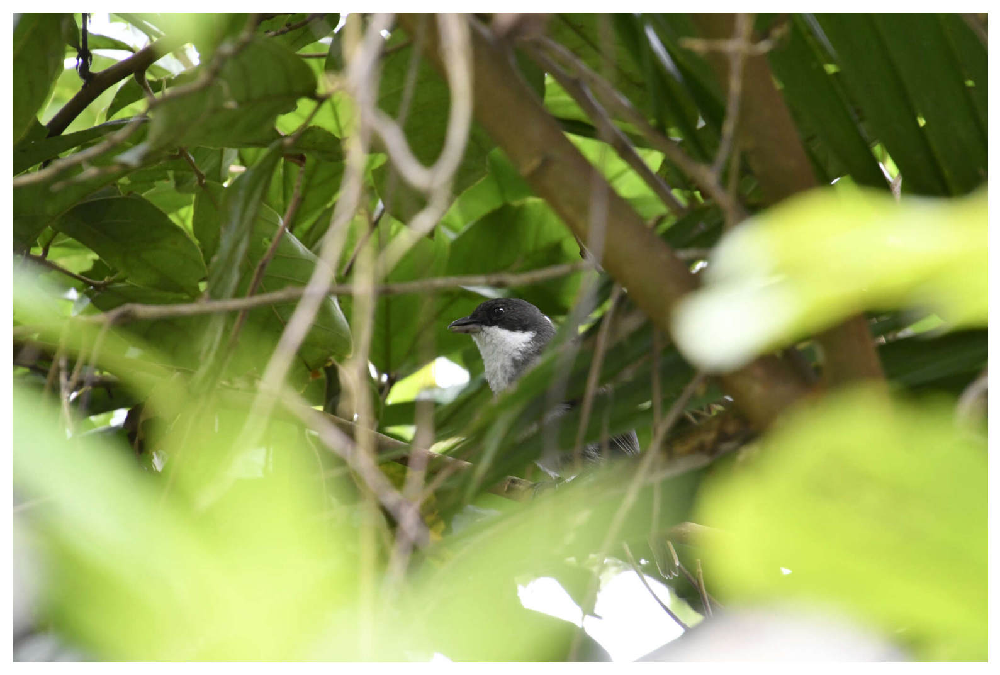

In [20]:
# Show an example
if image_files:
    print(f"Displaying image: {image_files[1]}")
    show_image(image_files[1])
else:
    print("No images found in the folder.")

In [21]:
# file_path structure:
# phylum_family/eol_content_id_eol_page_id
# (no new information can be extracted by the file_path column)

In [22]:
# Count the number of images
print("Number of images:", len(image_files))

Number of images: 11983


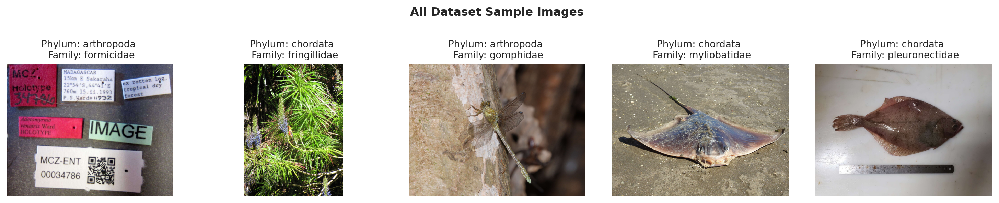

In [45]:
# Function to display images with simplified titles
# Enable LaTeX rendering in Matplotlib
plt.rc('text', usetex=False)  # Set to True if LaTeX is installed, False for mathtext
plt.rc('font', family='sans-serif')

def show_images(df, split_name, n=5):
    """Displays n images from a split with phylum and family titles."""
    plt.figure(figsize=(15, 3))
    if len(df) > n:
        # Randomly sample n images if n is less than the number of images (list)
        sample_df = df.sample(n=n, random_state=42)
    else:
        # Select the first n images if n is equal than the number of images
        sample_df = df.iloc[:n]
    for i, (_, row) in enumerate(sample_df.iterrows()):
        img_path = os.path.join('./data/rare_species 1', row['file_path'])
        img = Image.open(img_path)
        plt.subplot(1, n, i+1)
        plt.imshow(img)
        plt.title(f"Phylum: {row['phylum']} \n Family: {row['family']}", fontsize=10)
        plt.axis('off')
    plt.suptitle(f"{split_name} Sample Images", fontsize=12, weight='bold')
    plt.tight_layout()
    plt.show()
show_images(rare_species_df[5:10], split_name="All Dataset", n=5)

> **Note:** As we can see in the first picture, there are ***"outliers"*** that do not visually represent the species/family, but rather information about it. 

- Given the large number of photos, it is not possible to check and clean these cases, but we are aware that this factor could influence the model results.

## 🔧 **Data Pre-Proccessing**

In [24]:
# Encode the target variable ('family')
label_encoder = LabelEncoder()
rare_species_df['family_encoded'] = label_encoder.fit_transform(rare_species_df['family'])
num_classes = len(label_encoder.classes_)
print(f"\nNumber of unique families (classes): {num_classes}")


Number of unique families (classes): 202


In [25]:
# Check Label Encoding
pd.DataFrame({
    'family': label_encoder.classes_,
    'family_encoded': np.arange(num_classes)
}).sort_values(by='family_encoded')

,family,family_encoded
0,accipitridae,0
1,acipenseridae,1
2,acroporidae,2
3,agamidae,3
4,agariciidae,4
...,...,...
197,vespertilionidae,197
198,viperidae,198
199,vireonidae,199
200,vombatidae,200


**Note:** We chose **`LabelEncoder`** over **`OHE`** due to 202 classes, avoiding large sparse vectors that increase memory and training time.

### ⚖️ **Training/Validation Division**

In [30]:
# Split the dataset into train, validation, and test sets (70-15-15 split)
# Stratify on 'family' to maintain class distribution
train_df, temp_df = train_test_split(rare_species_df,
                                     test_size=0.3, 
                                     stratify=rare_species_df['family'], 
                                     random_state=2025,
                                     shuffle=True)

val_df, test_df = train_test_split(temp_df, 
                                   test_size=0.5, 
                                   stratify=temp_df['family'], 
                                   random_state=2025,
                                   shuffle=True)

In [27]:
print(f"\n\033[1mTrain set size:\033[0m {len(train_df)} ({round(len(train_df) / len(rare_species_df) * 100, 2)}%)")
print(f"\033[1mValidation set size:\033[0m {len(val_df)} ({round(len(val_df) / len(rare_species_df) * 100, 2)}%)")
print(f"\033[1mTest set size:\033[0m {len(test_df)} ({round(len(test_df) / len(rare_species_df) * 100, 2)}%)")


Train set size: 8388 (70.0%)
Validation set size: 1797 (15.0%)
Test set size: 1798 (15.0%)


In [31]:
# Data Splitting | Train, Validation, and Test Image Paths
train_image_paths = [os.path.join(image_folder, file_path) for file_path in train_df['file_path']]
val_image_paths = [os.path.join(image_folder, file_path) for file_path in val_df['file_path']]
test_image_paths = [os.path.join(image_folder, file_path) for file_path in test_df['file_path']]

print(f"\n\033[1mNumber of train images:\033[0m {len(train_image_paths)}")
print(f"\033[1mNumber of validation images:\033[0m {len(val_image_paths)}")
print(f"\033[1mNumber of test images:\033[0m {len(test_image_paths)}")


Number of train images: 8388
Number of validation images: 1797
Number of test images: 1798


In [ ]:
# Function to move images to their respective folders (train, validation, and test)
import os
import shutil
from pathlib import Path

def copy_images(train_df, val_df, test_df, base_dir='dataset', source_dir=None):
    """
    Copies images to train, validation, and test folders, preserving the original folder structure by family.
    
    Parameters:
    -----------
    train_df : pandas.DataFrame
        DataFrame containing training set data with 'file_path' and 'family' columns.
    val_df : pandas.DataFrame
        DataFrame containing validation set data with 'file_path' and 'family' columns.
    test_df : pandas.DataFrame
        DataFrame containing test set data with 'file_path' and 'family' columns.
    base_dir : str, optional (default='dataset')
        Base directory where train, val, and test subfolders will be created.
    source_dir : str, optional (default=None)
        Source directory containing the original images (e.g., 'rare_species 1'). 
        If None, assumes file_path is absolute.
    
    Returns:
    --------
    None
    
    Raises:
    -------
    FileNotFoundError
        If an image file specified in the DataFrame is not found in the source directory.
    OSError
        If there are permission issues or other OS-related errors during file operations.
    
    Notes:
    ------
    - Creates subdirectories 'train', 'val', and 'test' under base_dir, with subfolders for each family.
    - Copies images to maintain the original directory structure (e.g., chordata_trogonidae).
    - Preserves the original files in the source directory unchanged.
    
    Sources:
    --------
    - os: Python Standard Library (https://docs.python.org/3/library/os.html)
    - shutil: Python Standard Library (https://docs.python.org/3/library/shutil.html)
    - pathlib.Path: Python Standard Library (https://docs.python.org/3/library/pathlib.html)
    """
    
    # Define destination directories
    train_dir = os.path.join(base_dir, 'train')
    val_dir = os.path.join(base_dir, 'val')
    test_dir = os.path.join(base_dir, 'test')
    
    # Create main directories if they don't exist
    for directory in [train_dir, val_dir, test_dir]:
        Path(directory).mkdir(parents=True, exist_ok=True)  # Source: pathlib.Path
    
    # Dictionary mapping DataFrames to their respective directories
    split_mapping = {
        'train': (train_df, train_dir),
        'val': (val_df, val_dir),
        'test': (test_df, test_dir)
    }

    # Process each split
    for split_name, (df, dest_dir) in split_mapping.items():
        print(f"Copying images to {split_name} directory...")
        for index, row in df.iterrows():
            # Get the source file path
            if source_dir:
                src_path = os.path.join(source_dir, row['file_path'])
            else:
                src_path = row['file_path']  # Assume absolute path if no source_dir
            
            # Extract family and construct family-specific subfolder
            family = row['family']
            family_dir = os.path.join(dest_dir, f"chordata_{family}")  # Match original structure
            
            # Create family subfolder if it doesn't exist
            Path(family_dir).mkdir(parents=True, exist_ok=True)  # Source: pathlib.Path
            
            # Extract filename and construct destination path
            file_name = os.path.basename(src_path)
            dest_path = os.path.join(family_dir, file_name)
            
            try:
                # Check if source file exists
                if not os.path.exists(src_path):
                    raise FileNotFoundError(f"Image not found: {src_path}")
                
                # Copy the file to the destination directory
                shutil.copy2(src_path, dest_path)                   # Source: shutil (preserves metadata)
                # print(f"Copied {file_name} to {family_dir}")      # Uncomment for verbose output
            
            except FileNotFoundError as e:
                print(f"Error: {e}")
                continue
            except OSError as e:
                print(f"OS Error: Could not copy {src_path} to {dest_path}. Reason: {e}")
                continue
    
    print("\nImage copying process completed.")

# Copy images to train, validation, and test folders
copy_images(train_df, val_df, test_df, base_dir='./data/', source_dir='./data/rare_species 1')


Copying images to train directory...

Copying images to val directory...

Copying images to test directory...

Image copying process completed.


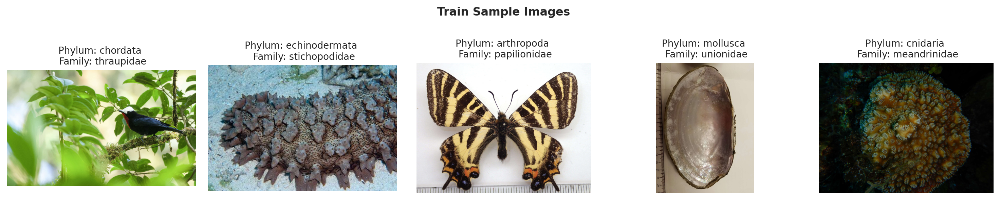

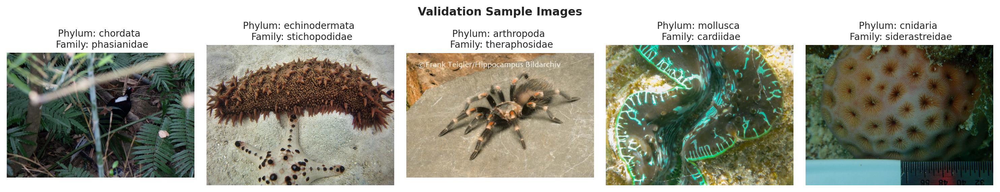

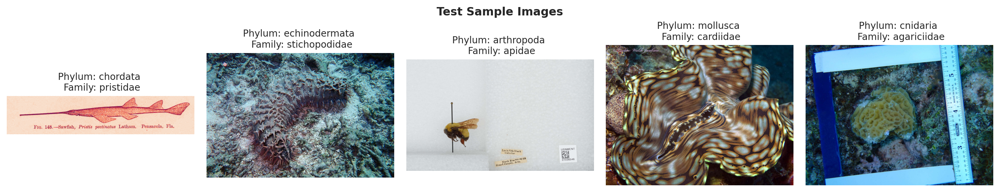

In [46]:
# Show 5 sample images from each split (stratified by phylum)
show_images(train_df.groupby('phylum', group_keys=False).apply(lambda x: x.sample(n=5, random_state=42)), split_name="Train", n=5)
show_images(val_df.groupby('phylum', group_keys=False).apply(lambda x: x.sample(n=5, random_state=42)),  split_name="Validation", n=5)
show_images(test_df.groupby('phylum', group_keys=False).apply(lambda x: x.sample(n=5, random_state=42)),  split_name="Test", n=5)

---

## **💾 Save Data**

In [48]:
# Check the distribution of the target variable in the train, validation, and test sets
train_distribution = train_df['family'].value_counts(normalize=True)
val_distribution = val_df['family'].value_counts(normalize=True)
test_distribution = test_df['family'].value_counts(normalize=True)

# Create a DataFrame to compare distributions
distribution_df = pd.DataFrame({
    'Train': train_distribution,
    'Validation': val_distribution,
    'Test': test_distribution
}).fillna(0)
distribution_df = distribution_df.sort_index()  # Sort by index (family names)
distribution_df

,Train,Validation,Test
family,,,
accipitridae,0.009895,0.010017,0.010011
acipenseridae,0.007511,0.007234,0.007786
acroporidae,0.017525,0.017251,0.017798
agamidae,0.005007,0.005008,0.005006
agariciidae,0.010014,0.010017,0.010011
...,...,...,...
vespertilionidae,0.005007,0.005008,0.005006
viperidae,0.002504,0.002782,0.002225
vireonidae,0.002504,0.002782,0.002225


In [53]:
# Save the train, validation, and test DataFrames to CSV files
train_df.to_csv('./data/train.csv', index=False)
val_df.to_csv('./data/val.csv', index=False)
test_df.to_csv('./data/test.csv', index=False)

---

# **🔗 Bibliography/References**

**[[1]]([https:](https://imageomics.github.io/bioclip/))**  Stevens, S., Wu, J., Thompson, M. J., Campolongo, E. G., Song, C. H., Carlyn, D. E., ... & Su, Y. (2024). Bioclip: A vision foundation model for the tree of life. In Proceedings of the IEEE/CVF conference on computer vision and pattern recognition (pp. 19412-19424).

<br>